In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import tqdm
import importlib

# Get parameter for Camera Calibration
---
To cancel distortion depending on a lens, I calculate parameter with chessboard images.

----------
camera_cal\calibration1.jpg
----------
cant find corners nx:9 ny:6
success: get corners nx:9 ny:5


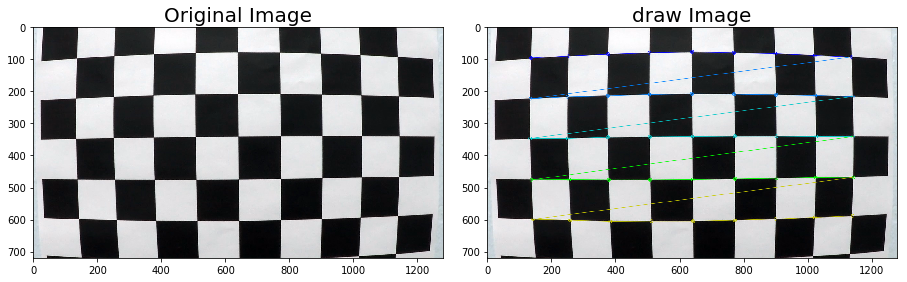

----------
camera_cal\calibration10.jpg
----------
success: get corners nx:9 ny:6


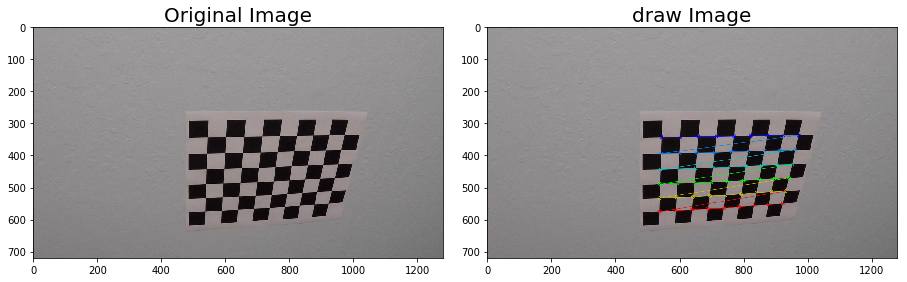

----------
camera_cal\calibration11.jpg
----------
success: get corners nx:9 ny:6


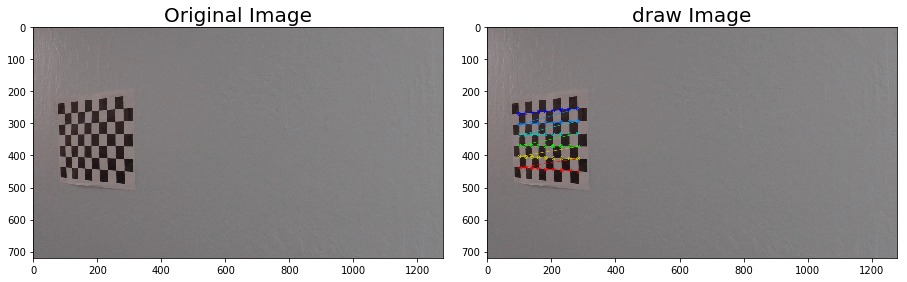

----------
camera_cal\calibration12.jpg
----------
success: get corners nx:9 ny:6


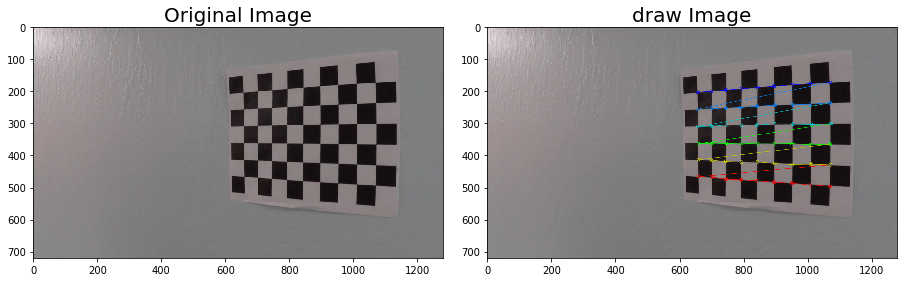

----------
camera_cal\calibration13.jpg
----------
success: get corners nx:9 ny:6


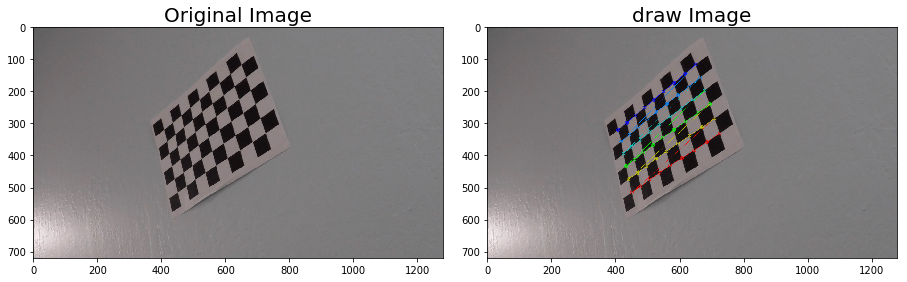

----------
camera_cal\calibration14.jpg
----------
success: get corners nx:9 ny:6


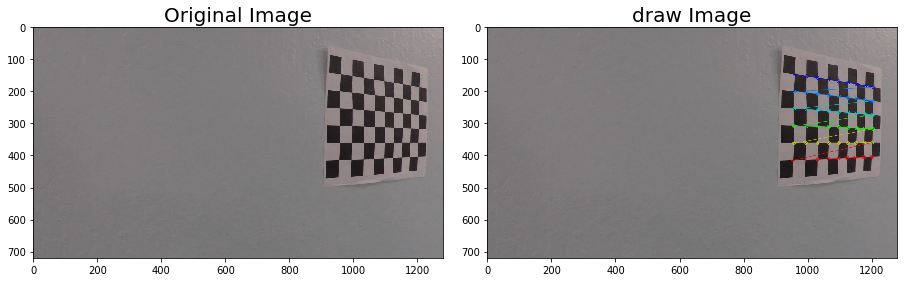

----------
camera_cal\calibration15.jpg
----------
success: get corners nx:9 ny:6


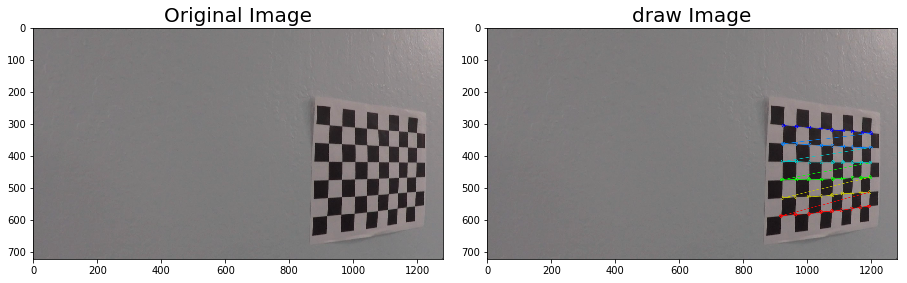

----------
camera_cal\calibration16.jpg
----------
success: get corners nx:9 ny:6


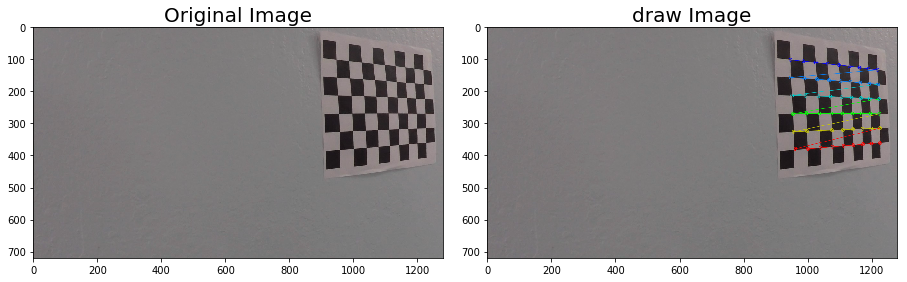

----------
camera_cal\calibration17.jpg
----------
success: get corners nx:9 ny:6


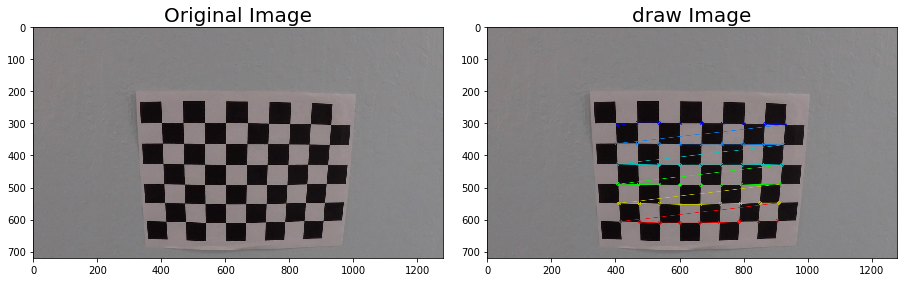

----------
camera_cal\calibration18.jpg
----------
success: get corners nx:9 ny:6


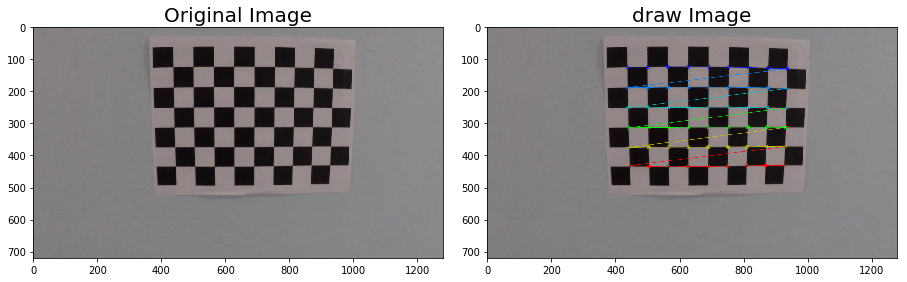

----------
camera_cal\calibration19.jpg
----------
success: get corners nx:9 ny:6


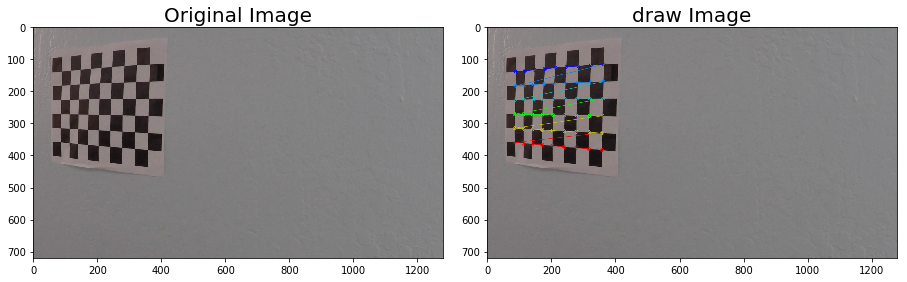

----------
camera_cal\calibration2.jpg
----------
success: get corners nx:9 ny:6


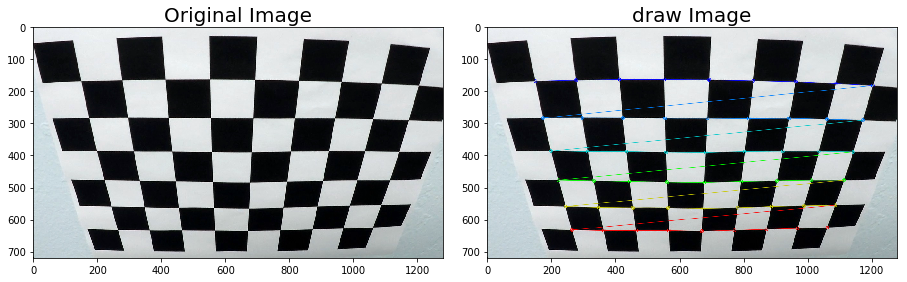

----------
camera_cal\calibration20.jpg
----------
success: get corners nx:9 ny:6


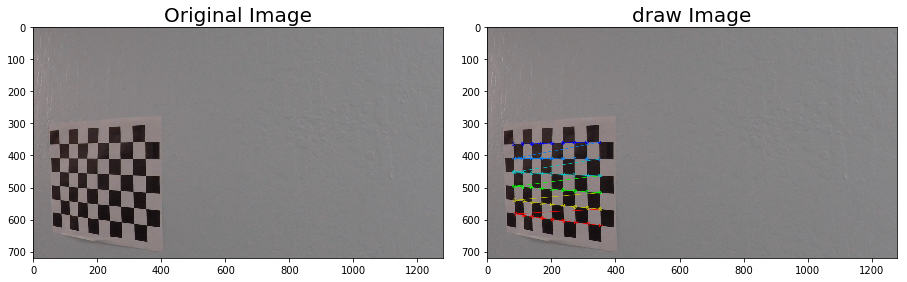

----------
camera_cal\calibration3.jpg
----------
success: get corners nx:9 ny:6


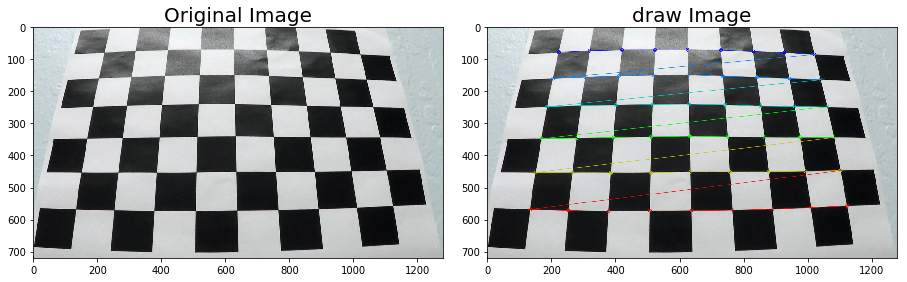

----------
camera_cal\calibration4.jpg
----------
cant find corners nx:9 ny:6
cant find corners nx:9 ny:5
cant find corners nx:8 ny:6
cant find corners nx:8 ny:5


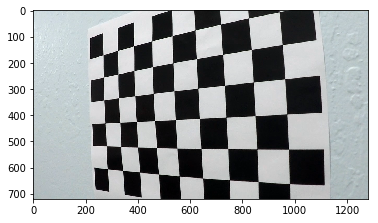

----------
camera_cal\calibration5.jpg
----------
cant find corners nx:9 ny:6
cant find corners nx:9 ny:5
cant find corners nx:8 ny:6
cant find corners nx:8 ny:5


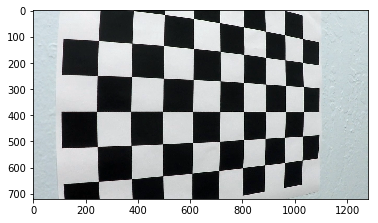

----------
camera_cal\calibration6.jpg
----------
success: get corners nx:9 ny:6


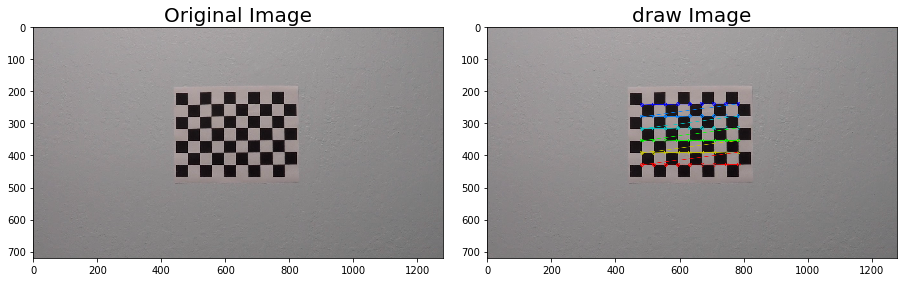

----------
camera_cal\calibration7.jpg
----------
success: get corners nx:9 ny:6


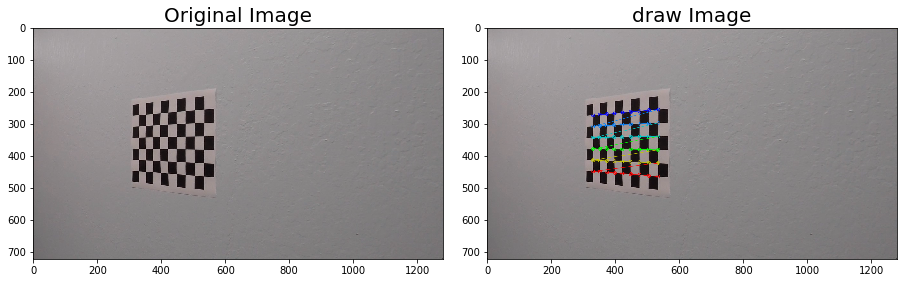

----------
camera_cal\calibration8.jpg
----------
success: get corners nx:9 ny:6


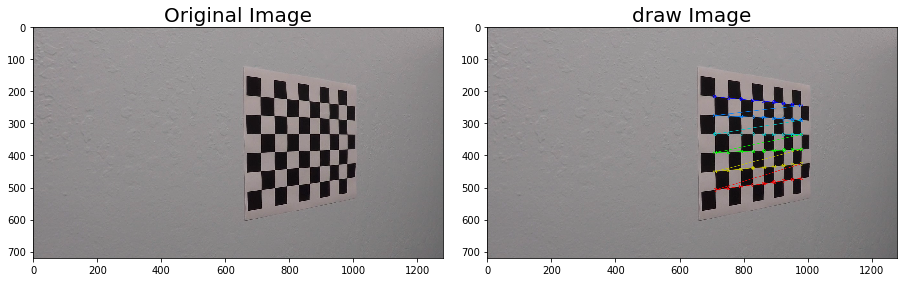

----------
camera_cal\calibration9.jpg
----------
success: get corners nx:9 ny:6


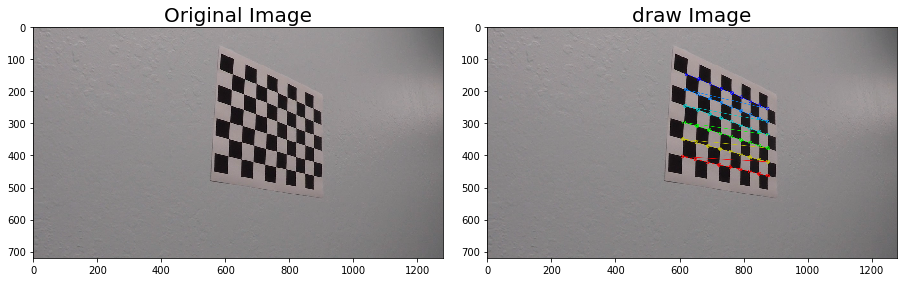

In [2]:
objpoints = []
imgpoints = []

images_path =glob.glob('camera_cal/*.jpg')

# Read in an image
nx = 9
ny = 6

for img_path in images_path:
    print('----------\n' + img_path + '\n----------')
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret = False

    for nx,ny in [[9,6], [9,5],[8,6],[8,5]]:
        objp= np.zeros((nx*ny,3), np.float32)
        objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
        
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        if ret == True:
            print('success: get corners nx:' + str(nx) + ' ny:' + str(ny))
            objpoints.append(objp)
            imgpoints.append(corners)
            # Draw and display the corners
            img_draw = np.copy(img)
            cv2.drawChessboardCorners(img_draw, (nx, ny), corners, ret)
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
            f.tight_layout()
            ax1.imshow(img)
            ax1.set_title('Original Image', fontsize=20)
            ax2.imshow(img_draw)
            ax2.set_title('draw Image', fontsize=20)
            plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
            plt.show()
            break
        else:
            # TODO はみ出した場合に備えて 8x6 9x5 8x5くらいは試してみるか(違い出るかしら？)
            print('can''t find corners nx:' + str(nx) + ' ny:' + str(ny))
            
    if ret == False:
        plt.imshow(img)
        plt.show()
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)   

check undistorted image and save for submit

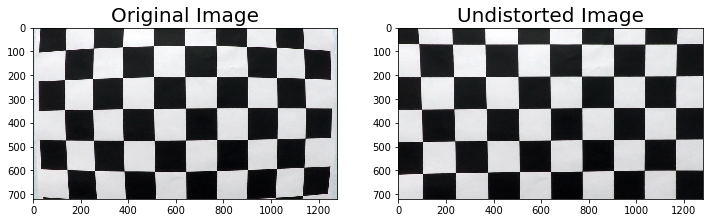

./output_images/calibration1.jpg


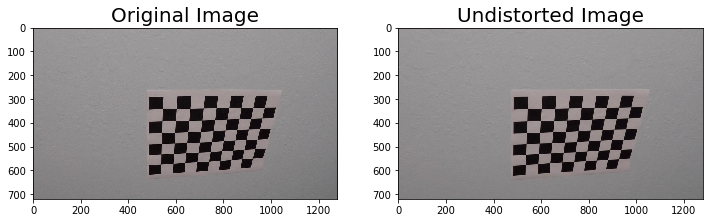

./output_images/calibration10.jpg


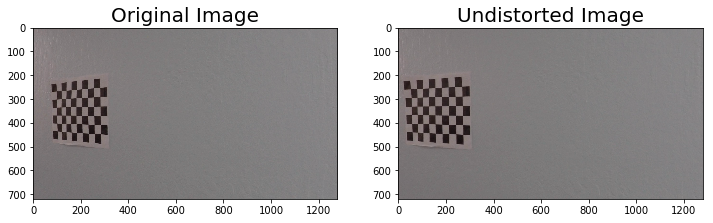

./output_images/calibration11.jpg


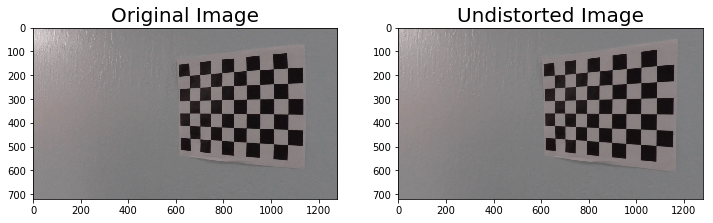

./output_images/calibration12.jpg


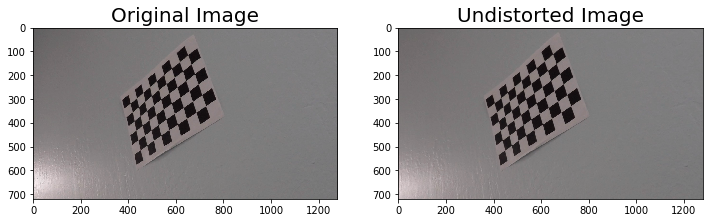

./output_images/calibration13.jpg


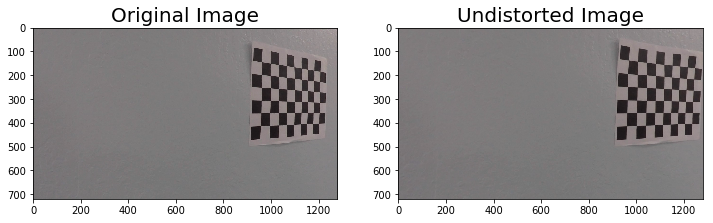

./output_images/calibration14.jpg


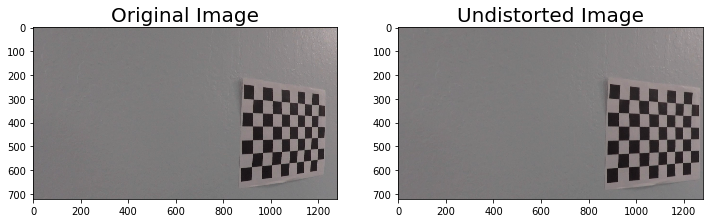

./output_images/calibration15.jpg


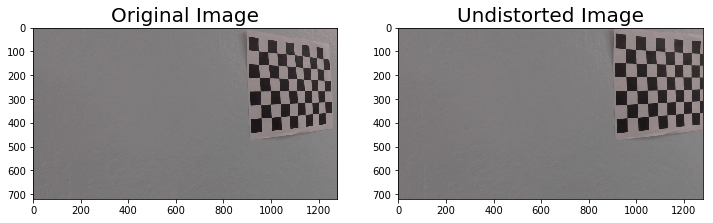

./output_images/calibration16.jpg


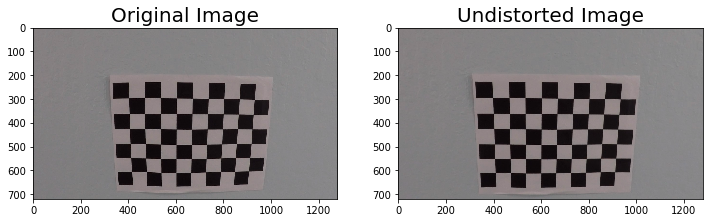

./output_images/calibration17.jpg


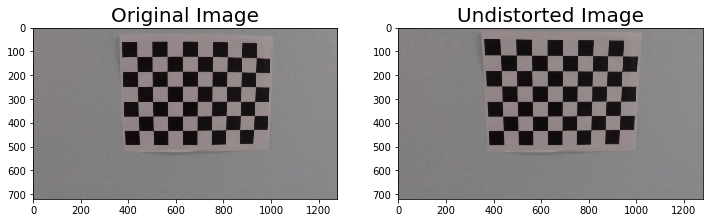

./output_images/calibration18.jpg


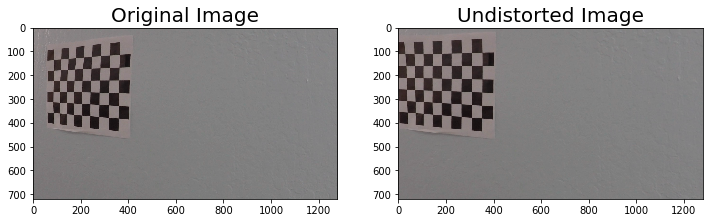

./output_images/calibration19.jpg


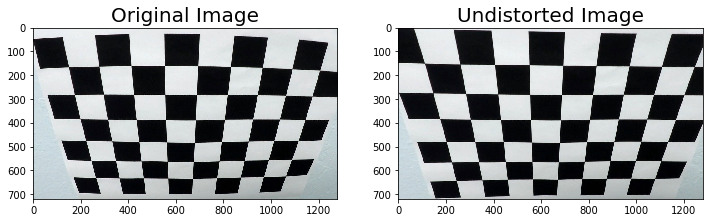

./output_images/calibration2.jpg


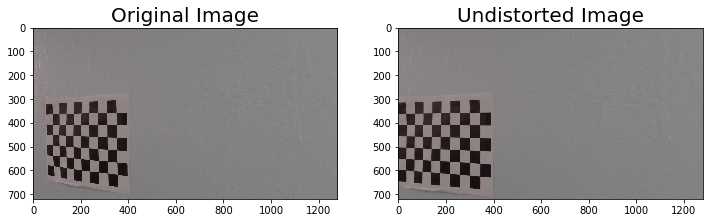

./output_images/calibration20.jpg


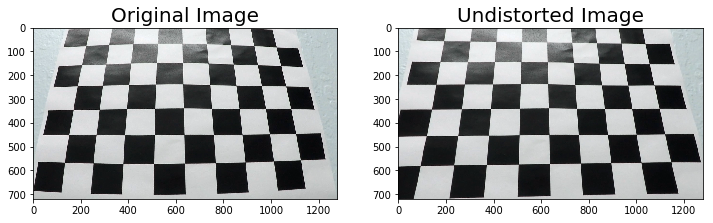

./output_images/calibration3.jpg


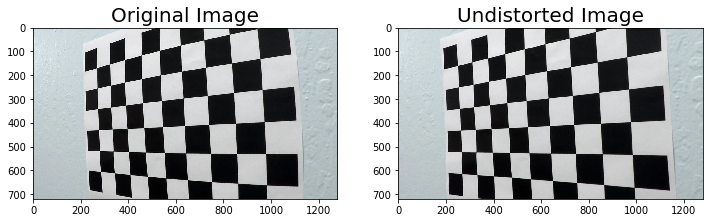

./output_images/calibration4.jpg


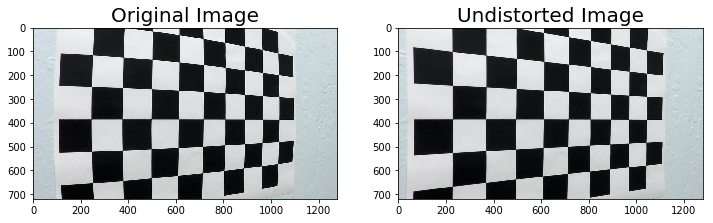

./output_images/calibration5.jpg


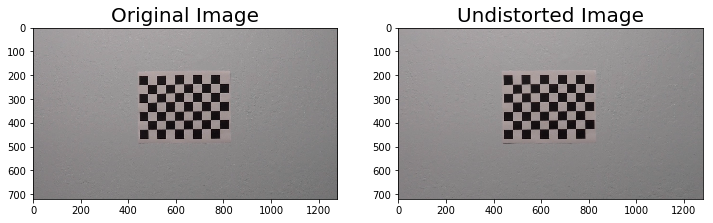

./output_images/calibration6.jpg


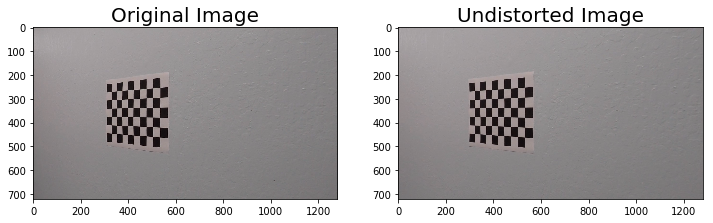

./output_images/calibration7.jpg


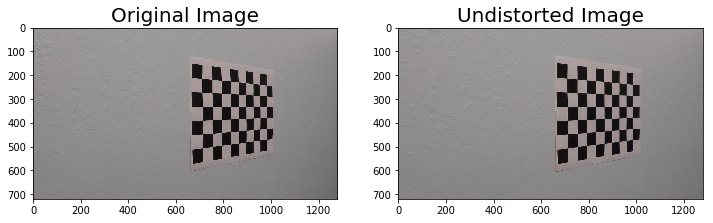

./output_images/calibration8.jpg


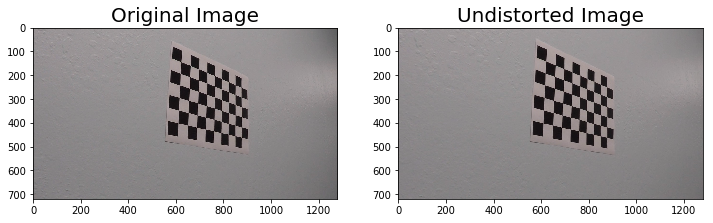

./output_images/calibration9.jpg


In [3]:
# For exmple
for img_path in images_path:
    img = cv2.imread(img_path)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=20)
    plt.show()
    
    # save
    name_ext = os.path.basename(img_path)
    name, ext = os.path.splitext(name_ext)
    out_path = './output_images/'+name+'.jpg'
    print(out_path)
    cv2.imwrite(out_path, undistorted)

# Get parameter for perspectivce transform
---

In [4]:
%matplotlib qt
images_path = glob.glob('./test_images/*.jpg')
print(images_path[0])
img = cv2.imread(images_path[0])
plt.imshow((cv2.cvtColor(cv2.undistort(img, mtx, dist, None, mtx), cv2.COLOR_BGR2RGB)))
plt.show()


./test_images\straight_lines1.jpg


(720, 1280, 3)
src:
[[ 681.  446.]
 [1039.  667.]
 [ 241.  667.]
 [ 599.  446.]]
dst:
[[960.   0.]
 [960. 720.]
 [320. 720.]
 [320.   0.]]


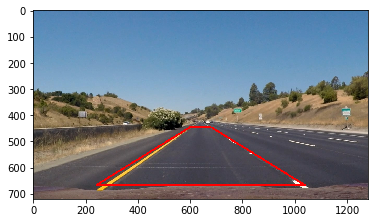

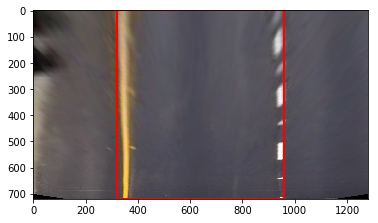

In [5]:
%matplotlib inline
print(img.shape)
y_size = img.shape[0]
x_size = img.shape[1]
src = np.array([])
src = [[681,446],[1039,667]]
src.append([x_size-src[1][0], src[1][1]])
src.append([x_size-src[0][0], src[0][1]])

dst = [[x_size*3//4, y_size*0//8], [x_size*3//4, y_size*8//8], [x_size*1//4, y_size*8//8], [x_size*1//4, y_size*0//8]]

src = np.array(src)
dst = np.array(dst)
src=src.astype('float32')
dst=dst.astype('float32')
print('src:')
print(src)
print('dst:')
print(dst)

#Compute the perspective transform:
M = cv2.getPerspectiveTransform(src, dst)
#Compute the inverse perspective transform:
Minv = cv2.getPerspectiveTransform(dst, src)
#Warp an image using the perspective transform, M:
warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

# draw
img_draw = np.copy(img)
cv2.polylines(img_draw, [src.astype('int32').reshape((-1,1,2))], True,(0,0,255), 5)
plt.imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))
plt.show()
warped_draw = np.copy(warped)
cv2.polylines(warped_draw, [dst.astype('int32').reshape((-1,1,2))], True,(0,0,255), 5)
plt.imshow(cv2.cvtColor(warped_draw, cv2.COLOR_BGR2RGB))
plt.show()

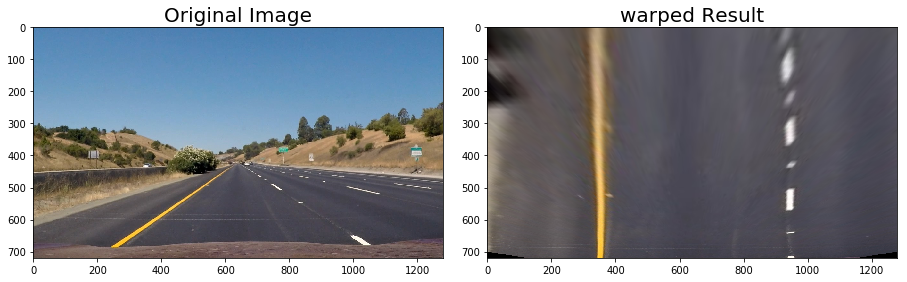

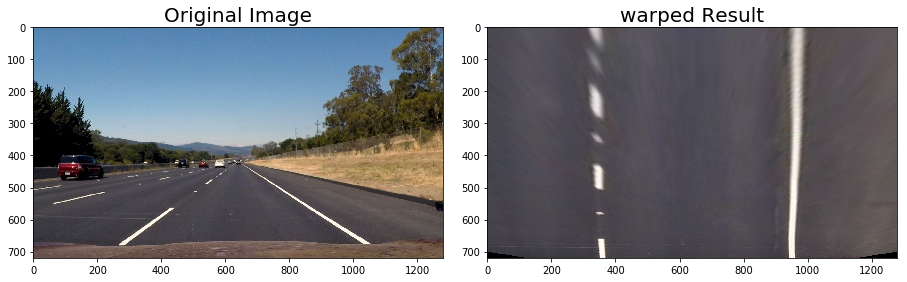

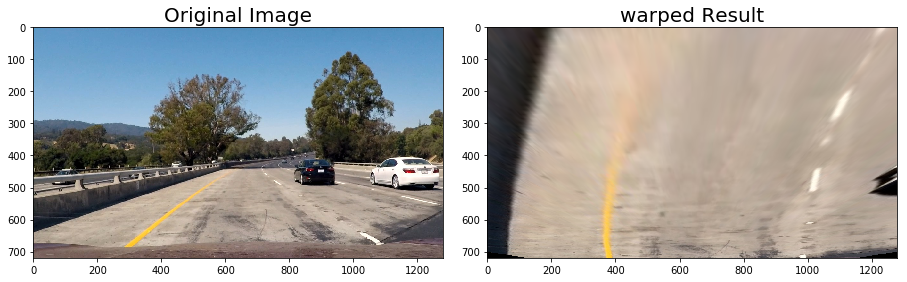

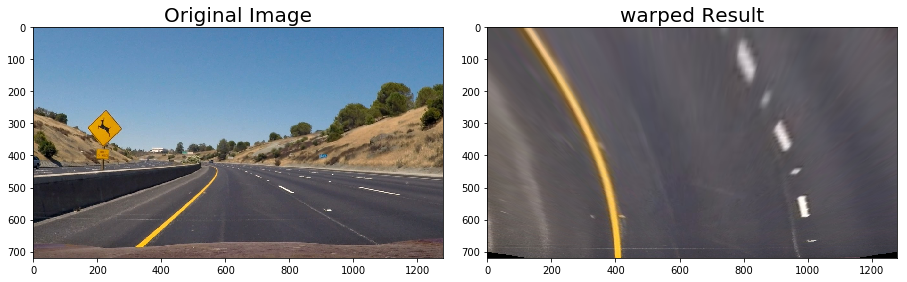

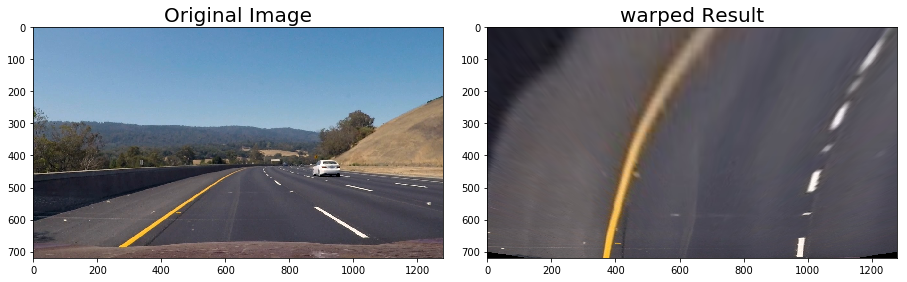

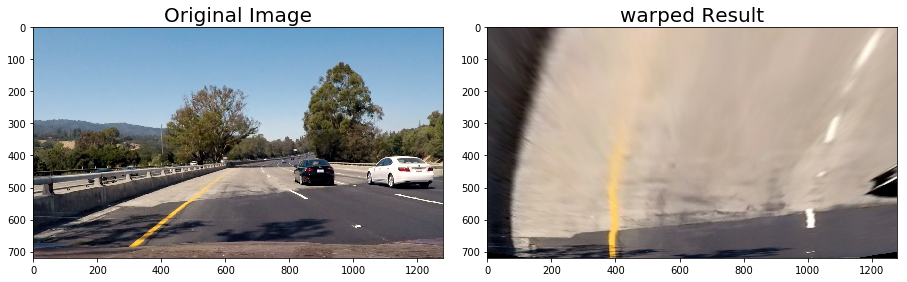

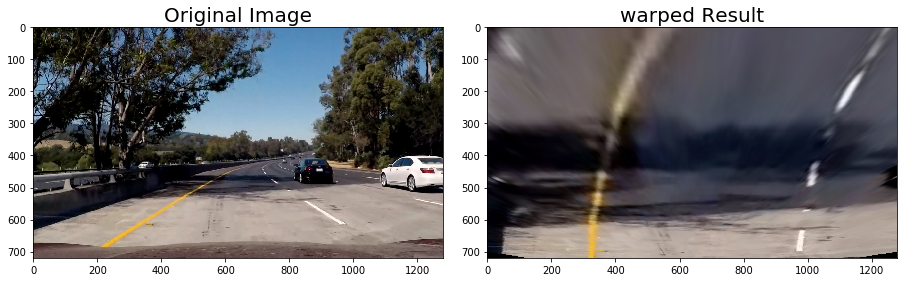

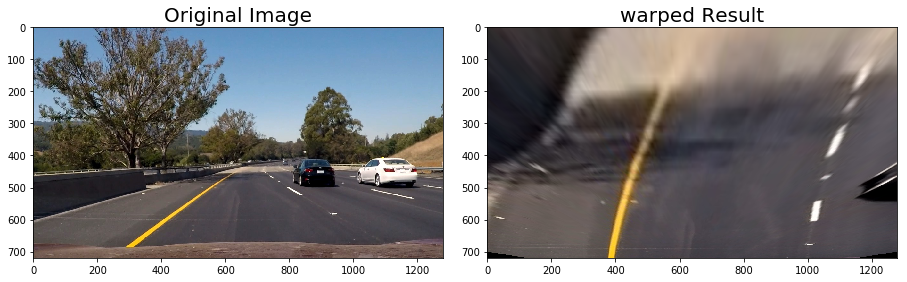

In [6]:
images_path = glob.glob('./test_images/*.jpg')
for image_path in images_path:
    img = cv2.imread(image_path)
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    ax2.set_title('warped Result', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

## (Preaparation for test) video to image
---

In [7]:
import os
import shutil
import cv2

def video_2_frames(video_file,  image_dir='./image_dir/', image_file='_%s.png'):
    # Delete the entire directory tree if it exists.
    if os.path.exists(image_dir):
        shutil.rmtree(image_dir)  

    # Make the directory if it doesn't exist.
    if not os.path.exists(image_dir):
        os.makedirs(image_dir)
        
    # name
    name_ext = os.path.basename(video_file)
    name, ext = os.path.splitext(name_ext)

    # Video to frames
    i = 0
    cap = cv2.VideoCapture(video_file)
    while(cap.isOpened()):
        flag, frame = cap.read()  # Capture frame-by-frame
        if flag == False:  # Is a frame left?
            break
        cv2.imwrite(image_dir + name + image_file % str(i).zfill(6), frame)  # Save a frame
        print('Save', image_dir + name + image_file % str(i).zfill(6))
        i += 1

    cap.release()  # When everything done, release the capture
#video_2_frames('input_videos/project_video.mp4', './frames_project/')
#video_2_frames('input_videos/challenge_video.mp4', './frames_challenge/')
#video_2_frames('input_videos/harder_challenge_video.mp4', './frames_harder_challenge/')

# Pipeline
---
import functions which are need for pipeline from adv_lane_find_pipeline.py

In [8]:
import adv_lane_find_pipeline as fcns

In [9]:
importlib.reload(fcns)

<module 'adv_lane_find_pipeline' from 'C:\\Users\\10001176274\\Desktop\\udacity_memo\\Udacity_Project2\\Udacity_Project2_adv_lane_lines\\adv_lane_find_pipeline.py'>

In [10]:
line = fcns.Line()

In [37]:
def FindLane(img, mtx, dist, M, Minv, img_path="", flag_plot=False):
    global line
    
    undistorted            = fcns.get_undistorted(img, mtx, dist)
    binary, color_binary   = fcns.get_binary(img, flag_plot=flag_plot)
    binary_bird_view       = fcns.get_bird_view(binary, M, flag_plot)
    color_binary_bird_view = fcns.get_bird_view(color_binary, M, flag_plot)
    left_fit, right_fit, fit_poly_image, histogram = fcns.fit_polynomial(binary_bird_view, line, flag_plot)
    gap_m = fcns.get_horizontal_gap_from_lane(left_fit, right_fit, img.shape, flag_plot)
    left_curverad, right_curverad = fcns.measure_curvature_real(left_fit, right_fit, img.shape[0], flag_plot)
    image_draw_lane = fcns.draw(binary_bird_view,  undistorted, Minv, left_fit, right_fit, flag_plot)
    image_draw_lane = fcns.draw_statistics(image_draw_lane, gap_m, left_curverad, right_curverad)
    
    # plot
    if flag_plot:      
        plt.imshow(cv2.cvtColor(image_draw_lane, cv2.COLOR_BGR2RGB))
        plt.show()
    
    # if img_path is not null, output the results of analysis as jpg file
    if img_path != "":
        
        plt.clf()
        f, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 15))
        ax1 = axes[0][0]
        ax2 = axes[0][1]
        ax3 = axes[0][2]
        ax4 = axes[1][0]
        ax5 = axes[1][1]
        ax6 = axes[1][2]
        #f.tight_layout()
        ax1.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
        ax1.set_title(img_path, fontsize=20)
        ax2.imshow(color_binary)
        ax2.set_title('color binary', fontsize=20)
        ax3.imshow(color_binary_bird_view, cmap='gray')
        ax3.set_title('color_binary_bird_view', fontsize=20)
        ax4.plot(histogram)
        ax4.set_title('histogram', fontsize=20)
        ax5.imshow(fit_poly_image)
        ax5.set_title('fit_poly_image', fontsize=20)
        ax6.imshow(cv2.cvtColor(image_draw_lane,cv2.COLOR_BGR2RGB))
        ax6.set_title('image_draw_lane', fontsize=20)
        
        name_ext = os.path.basename(img_path)
        name, ext = os.path.splitext(name_ext)
        out_path = './output_images_for_analysis/results_'+name+'.jpg'
        plt.savefig(out_path) # -----(2)

    return image_draw_lane

In [38]:
def pipeline(img):    
    return FindLane(img, mtx, dist, M, Minv, flag_plot=False)

## Test with target images
---

test_images/test4.jpg


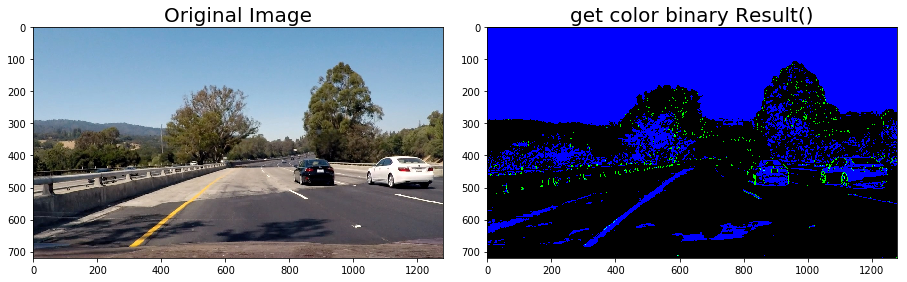

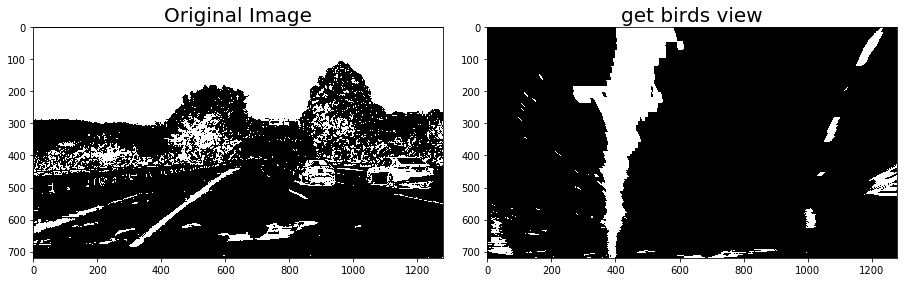

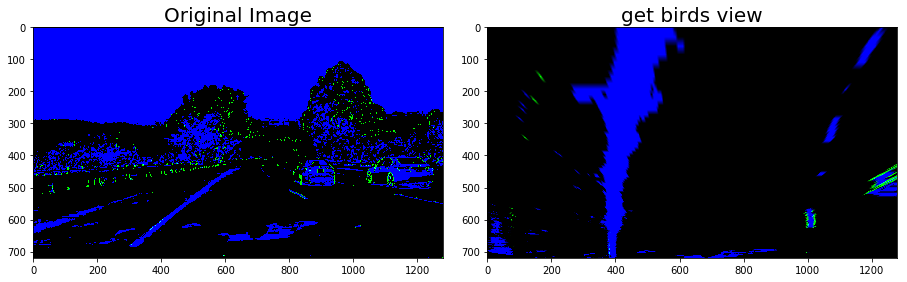

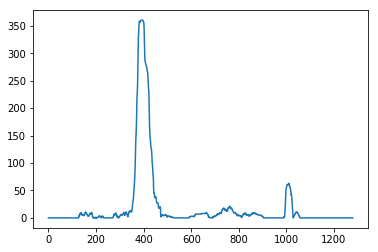

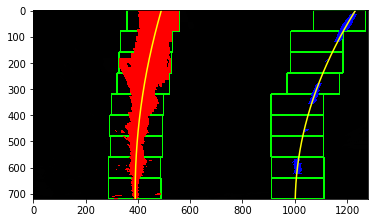

lane_width_pixel:612
gap_m:0.3
curvature left:2695.9m  right:1893.1m


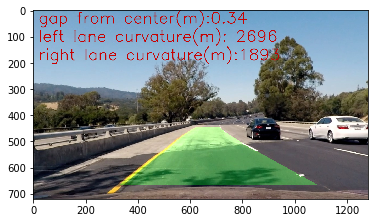

frames_project/project_video_000553.png


<Figure size 432x288 with 0 Axes>

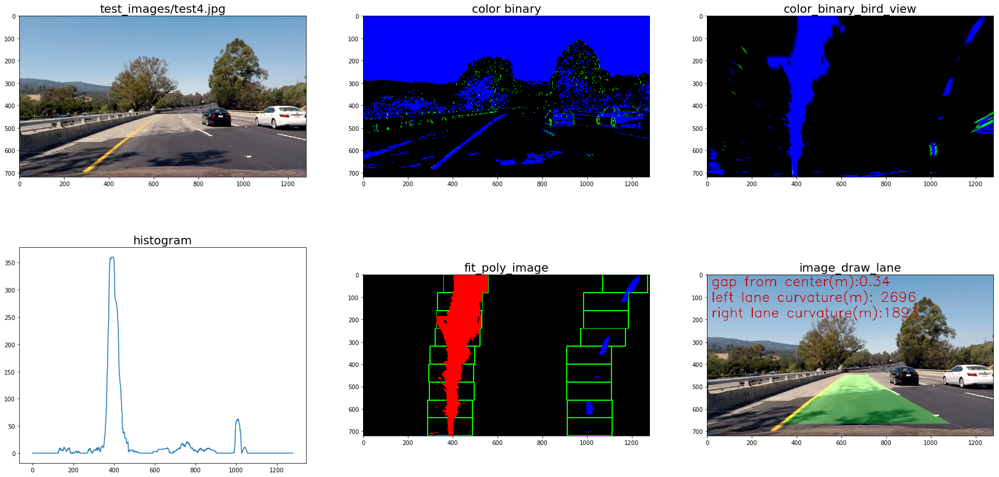

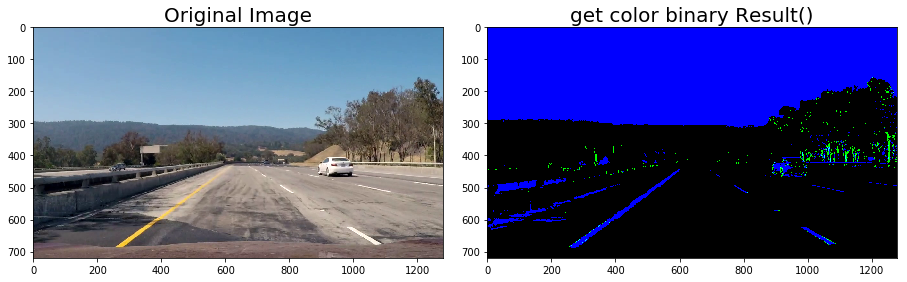

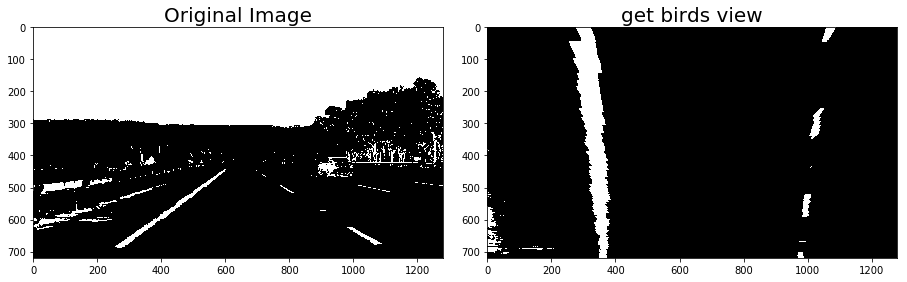

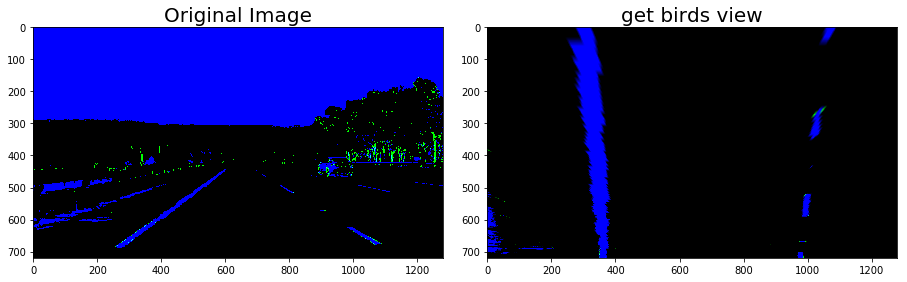

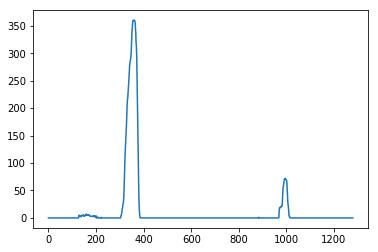

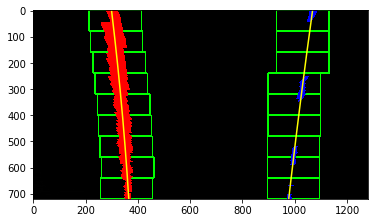

lane_width_pixel:611
gap_m:0.2
curvature left:12816.8m  right:30820.8m


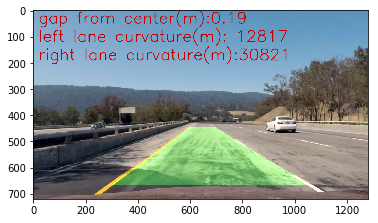

frames_project/project_video_000555.png


<Figure size 432x288 with 0 Axes>

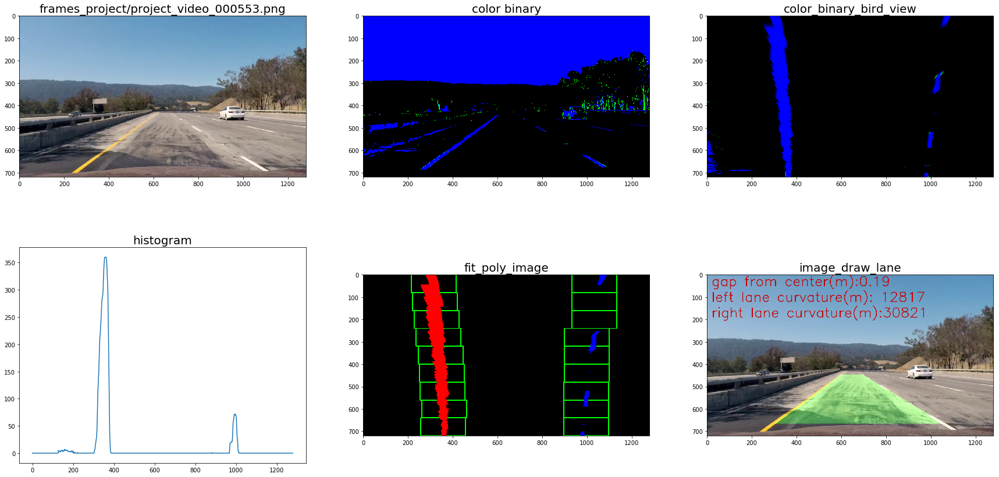

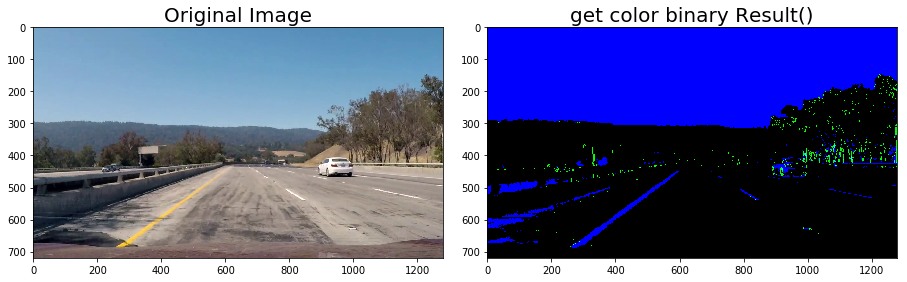

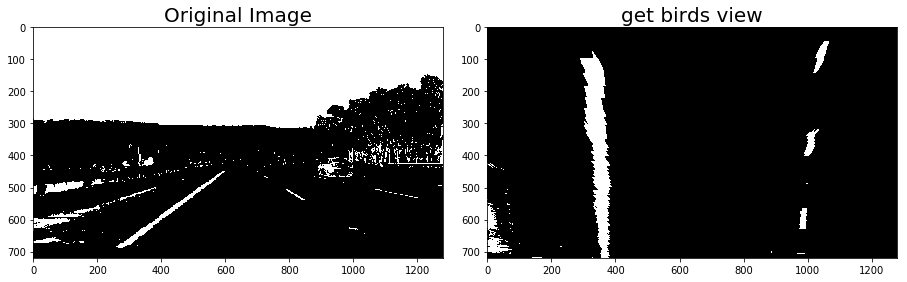

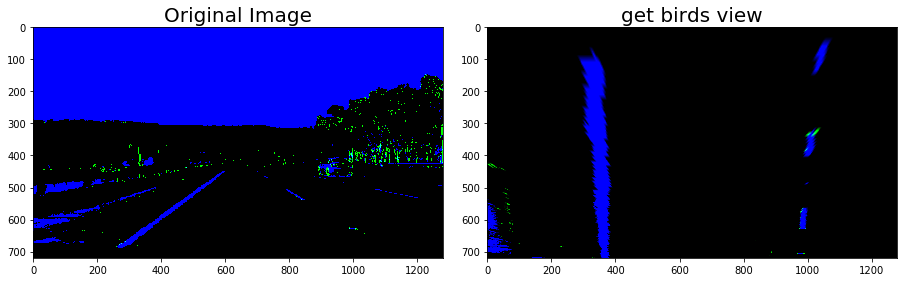

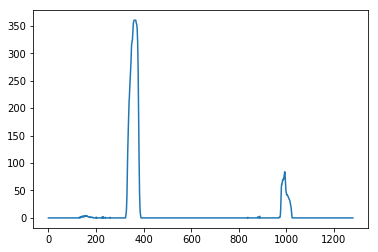

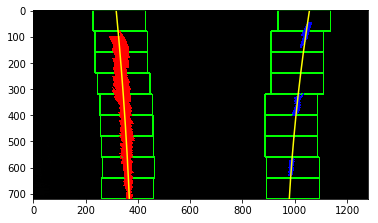

lane_width_pixel:612
gap_m:0.2
curvature left:14068.5m  right:7668.9m


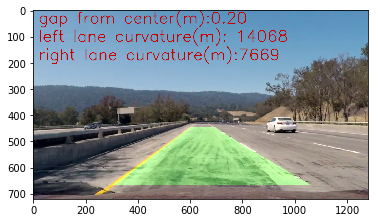

frames_challenge/challenge_video_000000.png


<Figure size 432x288 with 0 Axes>

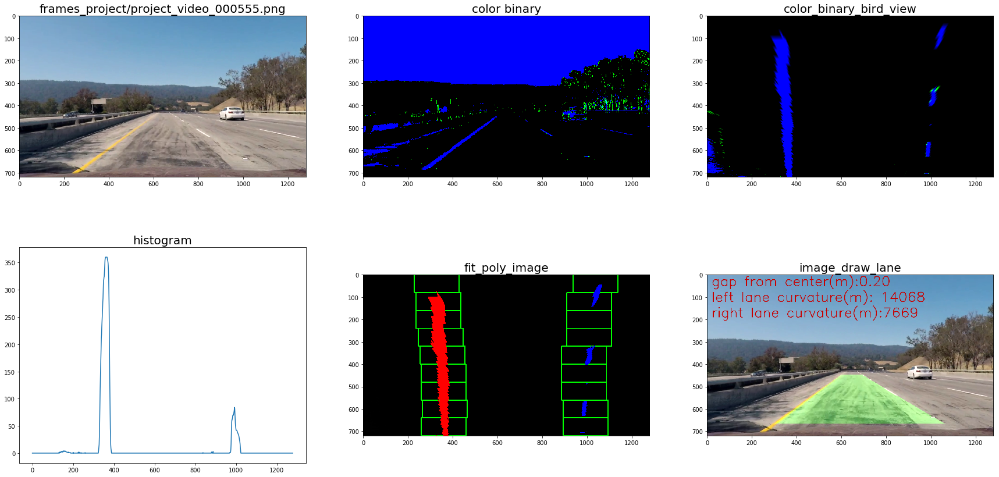

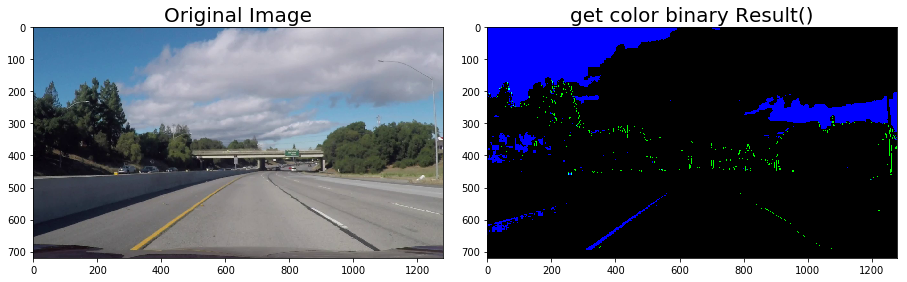

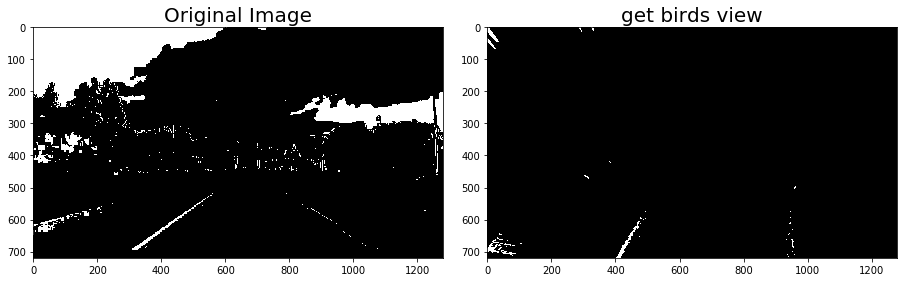

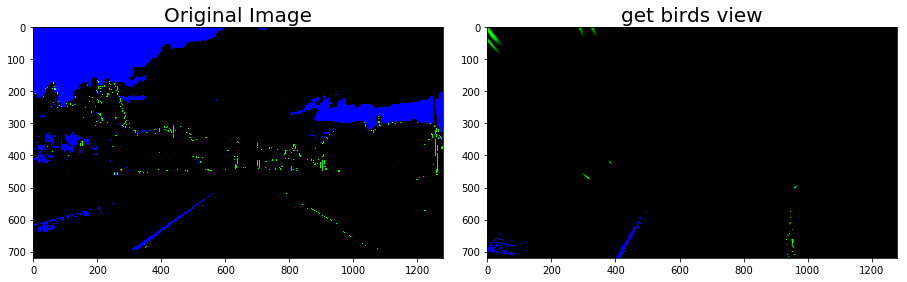

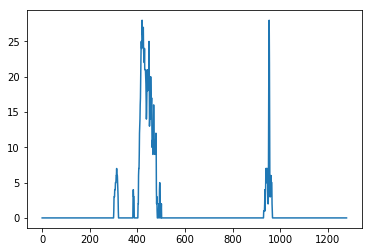

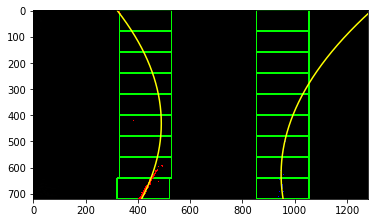

lane_width_pixel:541
gap_m:0.3
curvature left:1043.2m  right:1731.1m


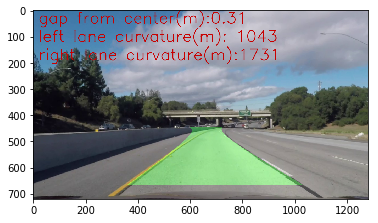

<Figure size 432x288 with 0 Axes>

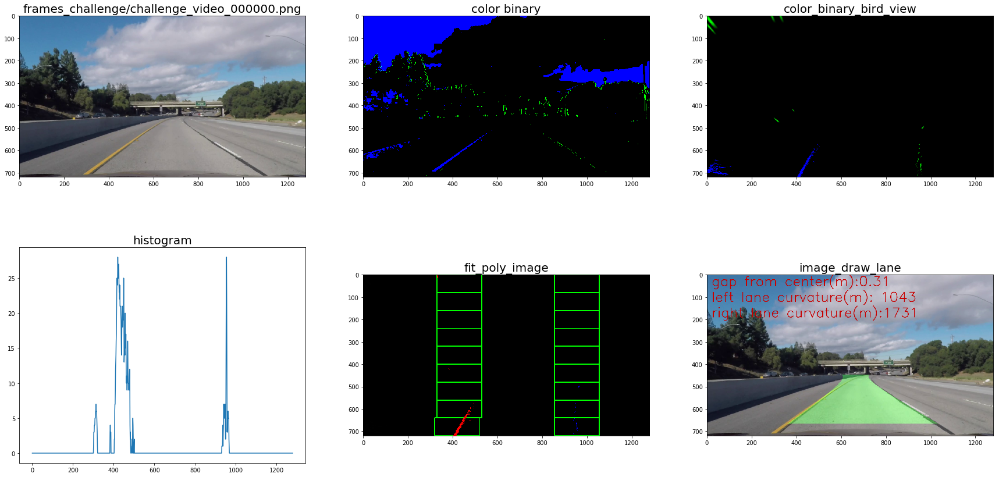

In [39]:
def test_with_target_frames():
    global line
    frames_path = ['test_images/test4.jpg',
                   'frames_project/project_video_000553.png', 
                   'frames_project/project_video_000555.png',
                  'frames_challenge/challenge_video_000000.png']
    for image_path in frames_path:
        line = fcns.Line()
        print(image_path)
        image_draw_lane = FindLane(cv2.imread(image_path), mtx, dist, M, Minv, img_path=image_path, flag_plot=True)

test_with_target_frames()

## Test with test images
---

In [14]:
def test():
    images_path = glob.glob('./test_images/*.jpg')
    for image_path in images_path:
        img = cv2.imread(image_path)
        print('-----------------------')
        print(image_path)
        print('-----------------------')
        FindLane(img, mtx, dist, M, Minv, flag_plot=True)
#test()

## Test with all video frames
---

In [15]:
def test_with_video_frames(dir_path):
    global line
    line = fcns.Line()
    
    images_path = glob.glob(dir_path)
    print(dir_path)
    for image_path in tqdm.tqdm(images_path):
        image_draw_lane = FindLane(cv2.imread(image_path), mtx, dist, M, Minv, img_path= image_path, flag_plot=False)
        
#test_with_video_frames('./frames_project/*.png')
#test_with_video_frames('./frames_challenge/*.png')
#test_with_video_frames('./frames_harder_challenge/*.png')

## test with project video
---

In [16]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

line = fcns.Line() # reset
output_path = 'output_videos/output_project_video.mp4'
input_video = VideoFileClip("input_videos/project_video.mp4") 

white_clip = input_video.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output_path, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_path))

[MoviePy] >>>> Building video output_videos/output_project_video.mp4
[MoviePy] Writing video output_videos/output_project_video.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:28<00:00,  8.69it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/output_project_video.mp4 

Wall time: 2min 28s


## test with challenge project video
---

In [ ]:
output_path = 'output_videos/challenge_video_output.mp4'
input_video = VideoFileClip("input_videos/challenge_video.mp4")

line = fcns.Line() # reset
white_clip = input_video.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output_path, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_path))

## test with harder challenge video
---

In [18]:
output_path = 'output_videos/harder_challenge_video_output.mp4'
input_video = VideoFileClip("input_videos/harder_challenge_video.mp4")

line = fcns.Line() # reset
white_clip = input_video.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output_path, audio=False)


HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_path))

[MoviePy] >>>> Building video output_videos/harder_challenge_video_output.mp4
[MoviePy] Writing video output_videos/harder_challenge_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [04:28<00:00,  5.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/harder_challenge_video_output.mp4 

Wall time: 4min 30s
